In [ ]:
# Load necessary libraries
import sys
import os
import anndata as ad
import pandas as pd
import scanpy as sc
import seaborn as sns; sns.set(color_codes=True)

# Import Scimap
import scimap as sm

In [195]:
# set working directory
os.chdir('/Users/melnike/Desktop/COMET_pipeline')

In [202]:
# Load data
adata = ad.read('tutorial_data.h5ad')

### Clustering and data exploration

In [203]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=10)# Computing the neighborhood graph
sc.tl.umap(adata) # Build a UMAP to visualize the neighbourhood graph

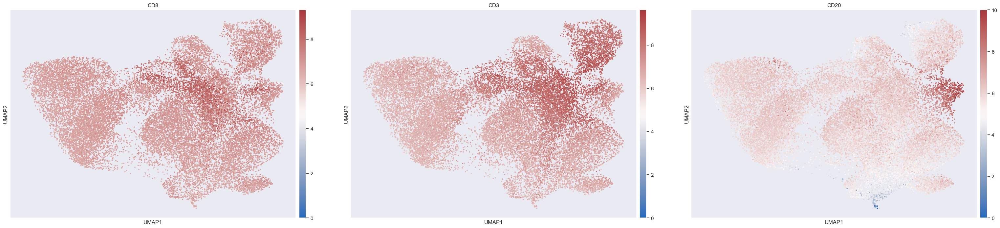

In [204]:
sc.pl.umap(adata, color=['CD8', 'CD3', 'CD20'], cmap= 'vlag', use_raw=False, s=30) # Plot the UMAP
# we can notice that segmentation is not nice as the co-expression area of CD3 and CD20 is quite big

In [205]:
sc.tl.leiden(adata, resolution = 0.8) # Clustering the neighborhood graph

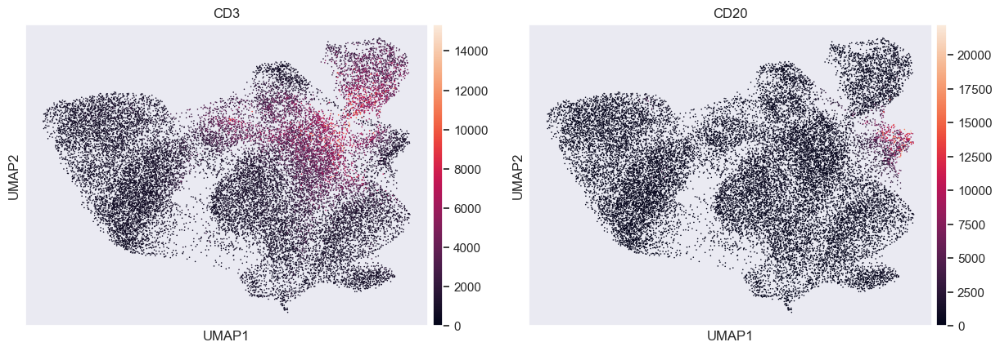

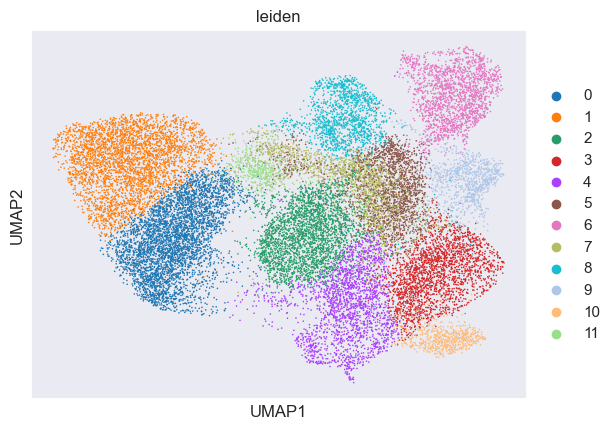

In [95]:
sc.pl.umap(adata, color=['CD3', 'CD20']) # View the clustering
sc.pl.umap(adata, color=['leiden'])

### Finding marker genes

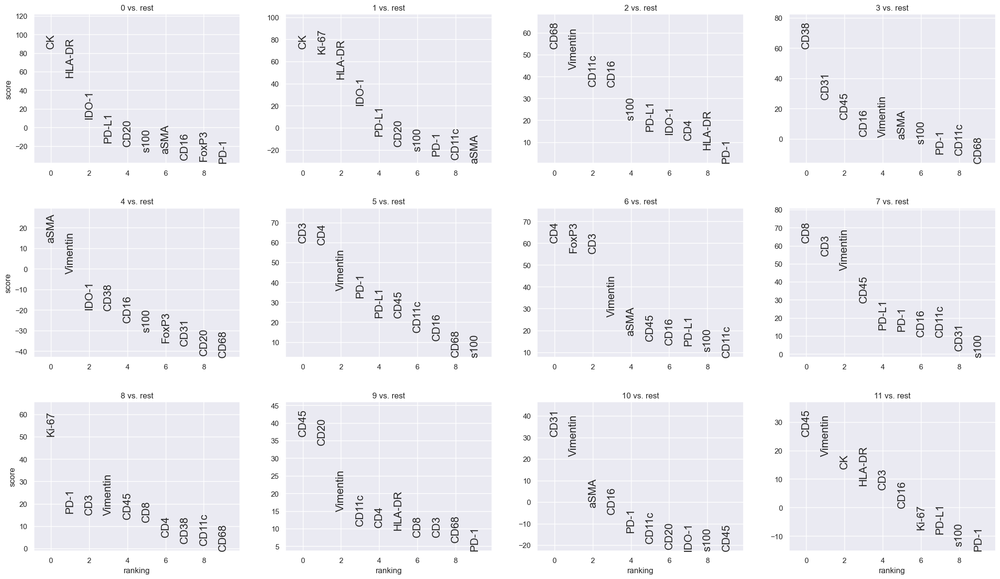

In [96]:
#cluster 0 - T cells 
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, fontsize=16)

####  From the above plots, it is likely that clusters 1, 2 and 7 could be combined to form a T cell cluster. However, as mentioned earlier the boundaries are not clear and it only gets increasingly complex as one would want to perform deeper phenotyping such as CD4 helper T cells, CD8 T cells, regulatory T cells, and so on.

### Probability distribution based phenotyping

In [97]:
# Probability distribution-based phenotyping
# This approach is more labor intensive; however, it is significantly more sensitive
# and much more scalable than clustering-based approaches. Takes less than 5 mins
# to run over a million cells once the gates are identified.
%gui qt

In [ ]:
image_path = '/Users/melnike/Desktop/COMET_pipeline/CRC.ome.tif'
# marker_of_interest = 'CD4' # a marker of interest
# sm.pl.gate_finder (image_path, adata, marker_of_interest, 
#                    from_gate = 5.5, to_gate = 8.5, increment = 0.1, point_size=30, 
#                  markers=['aSMA', 'CD20'])

In [99]:
# manual_gate = pd.read_csv('manual_gates.csv')
# adata = sm.pp.rescale (adata, gate=manual_gate)

In [100]:
# View the scaled data (note that the log data is replaced with scaled data)
# If you ever want the log data back you will need to run-  np.log1p(adata.raw.X)
# adata.X 

#### Step 3: Run the phenotyping algorithm on the rescaled data using sm.tl.phenotype

Phenotyping Immune
Phenotyping Tumor
Phenotyping Endothelial
Phenotyping Proliferation
Phenotyping Suppressor
Phenotyping Epithelia
Phenotyping Vasculature
Phenotyping aSMA+ stroma
Phenotyping T cells
Phenotyping B cells
Phenotyping Myeloid Lineage
-- Subsetting B cells
Phenotyping Plasma cells
-- Subsetting T cells
Phenotyping CD4 T helper
Phenotyping CD8 T cyt
Phenotyping T reg
Phenotyping T activator
Consolidating the phenotypes across all groups


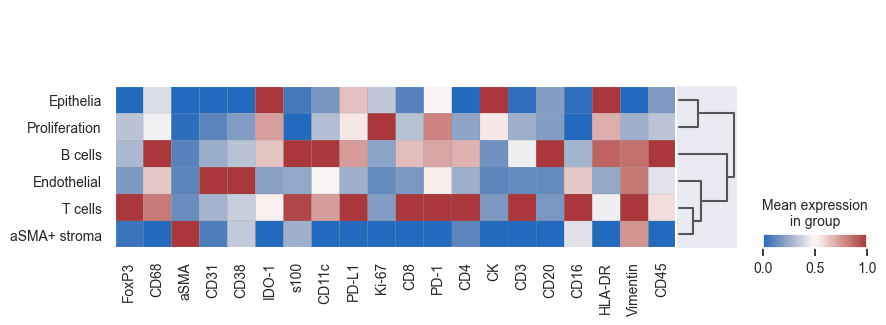

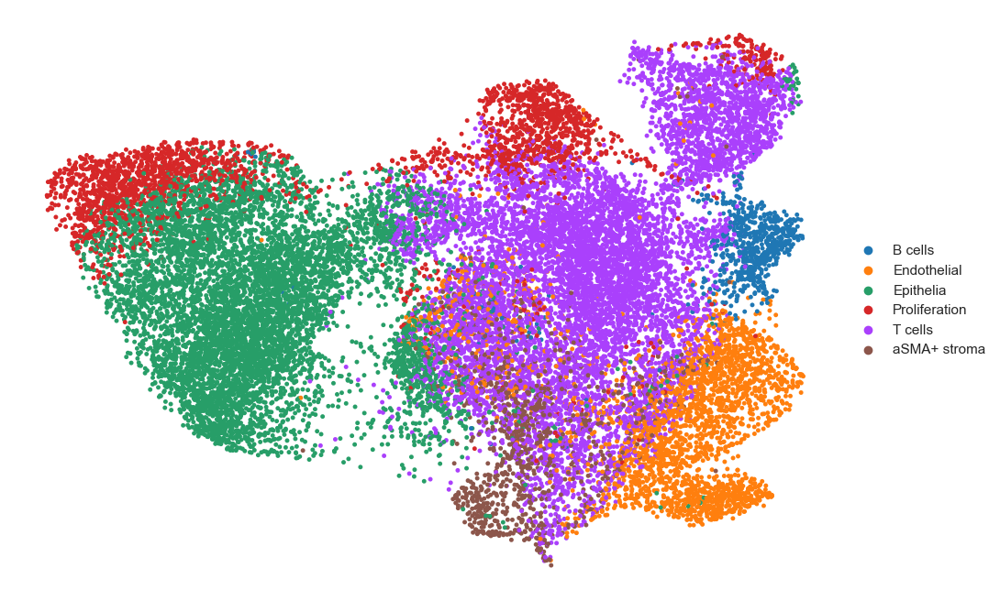

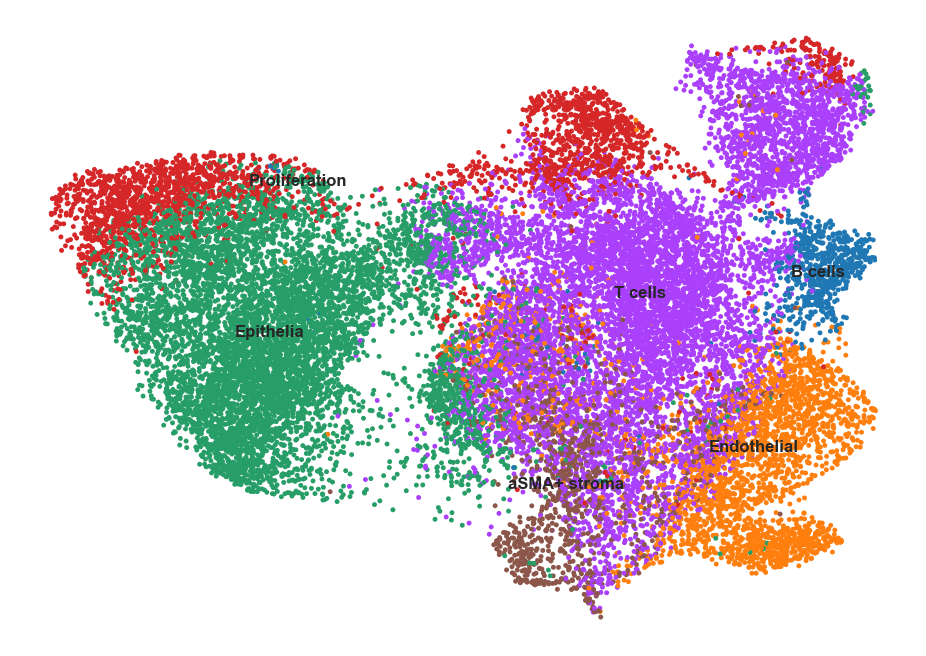

In [241]:
# Load the gating workflow
phenotype = pd.read_csv('phenotype_workflow2.csv')
adata = sm.tl.phenotype_cells (adata, phenotype=phenotype, label="phenotype") 

# Summary of the phenotyping
adata.obs['phenotype'].value_counts()

adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
sc.tl.dendrogram(adata, groupby='phenotype')

sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')

# sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib as mpl
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, cmap = mpl.colormaps['magma']) # View the clustering

sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, color_map = 'viridis', legend_loc='on data') # View the clustering

Phenotyping NK cells
Phenotyping Plasma cells
Phenotyping T helper
Phenotyping T cyt
Phenotyping T reg
Phenotyping Macrophages
Consolidating the phenotypes across all groups


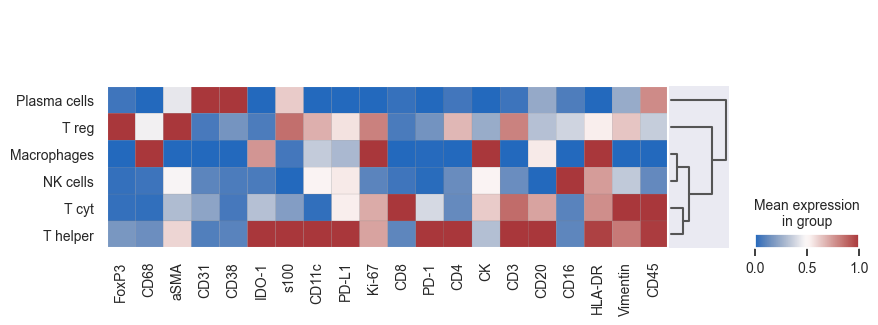

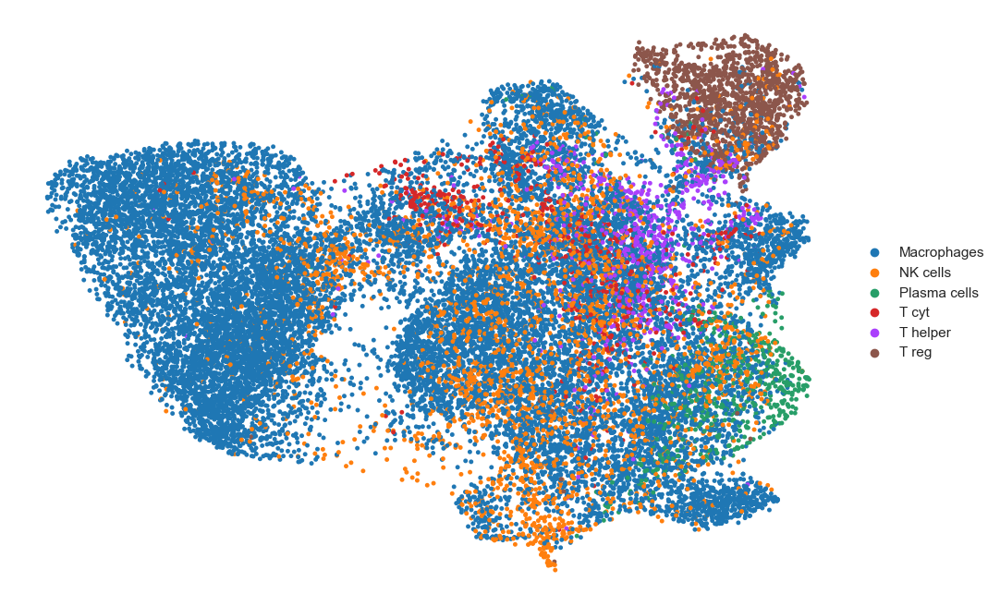

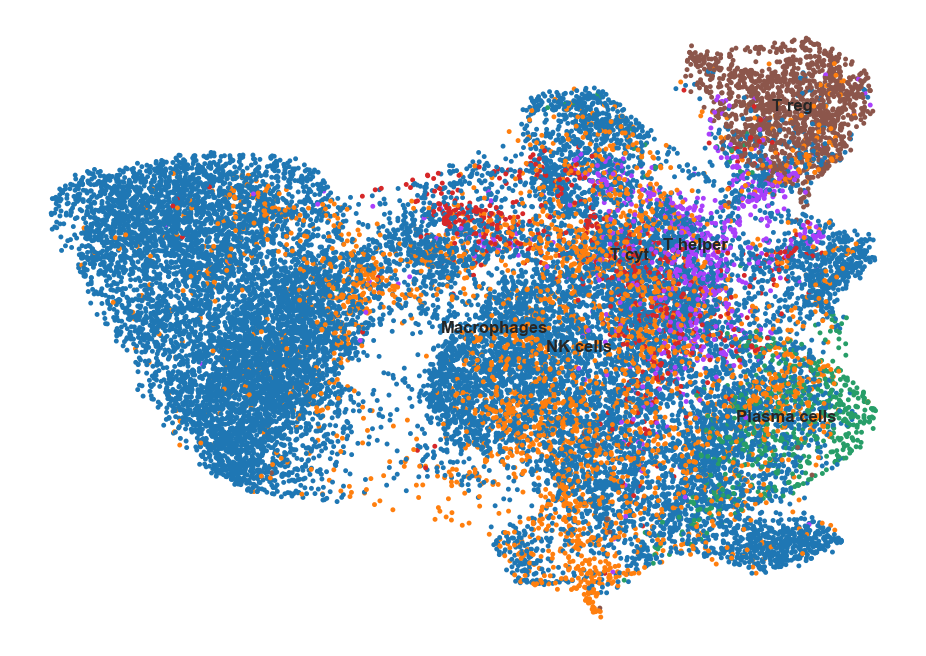

In [240]:
# Load the gating workflow
phenotype = pd.read_csv('phenotype_workflow4.csv')
adata = sm.tl.phenotype_cells (adata, phenotype=phenotype, label="phenotype") 

# Summary of the phenotyping
adata.obs['phenotype'].value_counts()

adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
sc.tl.dendrogram(adata, groupby='phenotype')

sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')

# sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib as mpl
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, cmap = mpl.colormaps['magma']) # View the clustering

sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, color_map = 'viridis', legend_loc='on data') # View the clustering

Phenotyping T helper act
Phenotyping CD8 T cyt act
Phenotyping T reg
Phenotyping B act
Consolidating the phenotypes across all groups


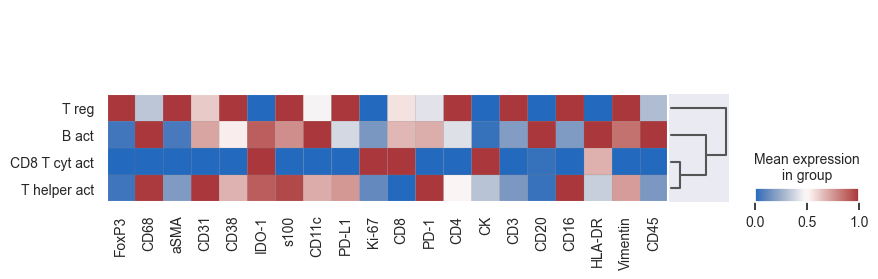

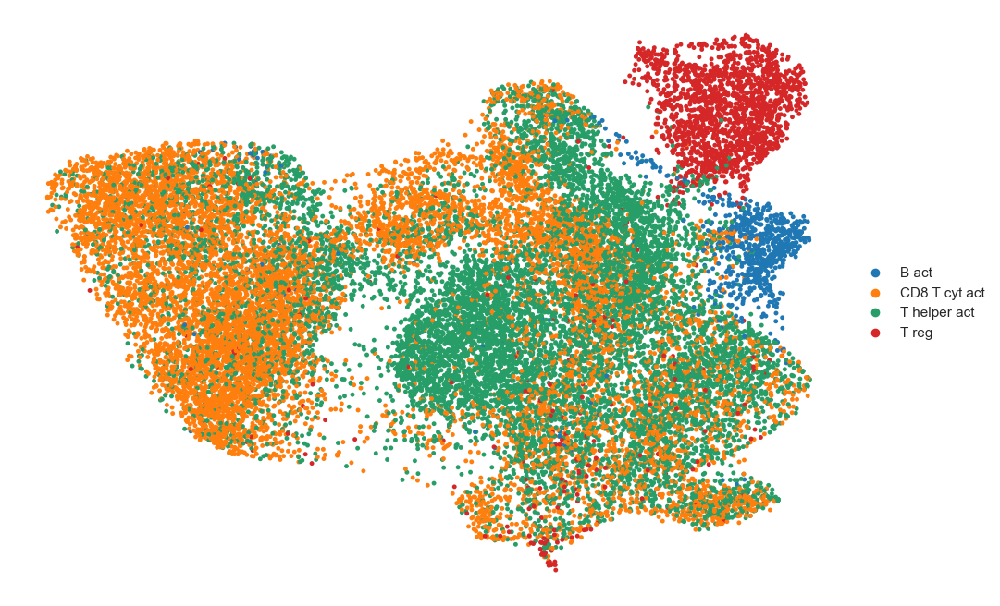

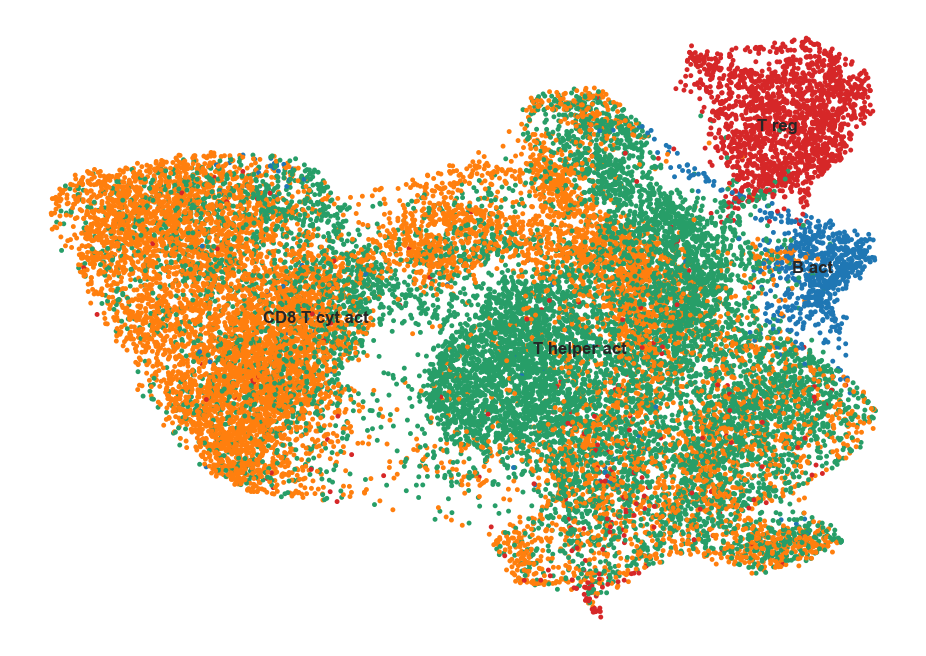

In [238]:
# Load the gating workflow
# T reg + B and T act cells with PD-1+ 
phenotype = pd.read_csv('phenotype_workflow5.csv')
adata = sm.tl.phenotype_cells (adata, phenotype=phenotype, label="phenotype") 

# Summary of the phenotyping
adata.obs['phenotype'].value_counts()

adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
sc.tl.dendrogram(adata, groupby='phenotype')

sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')

# sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib as mpl
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, cmap = mpl.colormaps['magma']) # View the clustering

sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, color_map = 'viridis', legend_loc='on data') # View the clustering

Phenotyping Immune
Phenotyping Tumor
-- Subsetting Tumor
Phenotyping Endothelial
Phenotyping Proliferation
Phenotyping Suppressor
Phenotyping Epithelia
-- Subsetting Endothelial
Phenotyping Vasculature
Phenotyping aSMA+ stroma
-- Subsetting Immune
Phenotyping T cells
Phenotyping B cells
Phenotyping Myeloid Lineage
-- Subsetting Myeloid Lineage
Phenotyping T cells
Phenotyping B cells
Phenotyping NK cells
Phenotyping CD68+ Macrophages
Phenotyping Dendritic cells
-- Subsetting B cells
Phenotyping Plasma cells
-- Subsetting T cells
Phenotyping CD4 T helper
Phenotyping CD8 T cyt
Phenotyping T reg
Phenotyping T activator
-- Subsetting CD4 T helper
Phenotyping Follicular T Helper
-- Subsetting CD8 T cyt
Phenotyping PD1+ CD8+ cells
-- Subsetting CD68+ Macrophages
Phenotyping M1 Macrophages
Consolidating the phenotypes across all groups


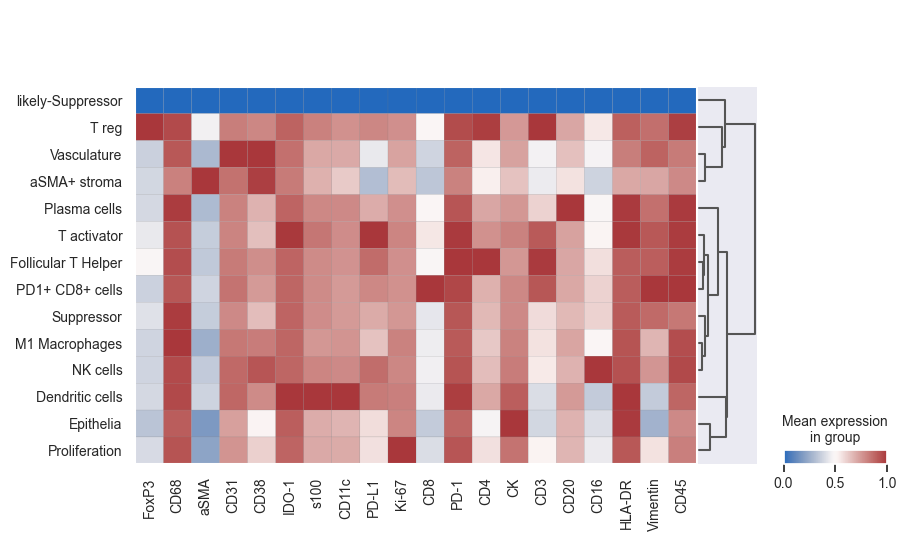

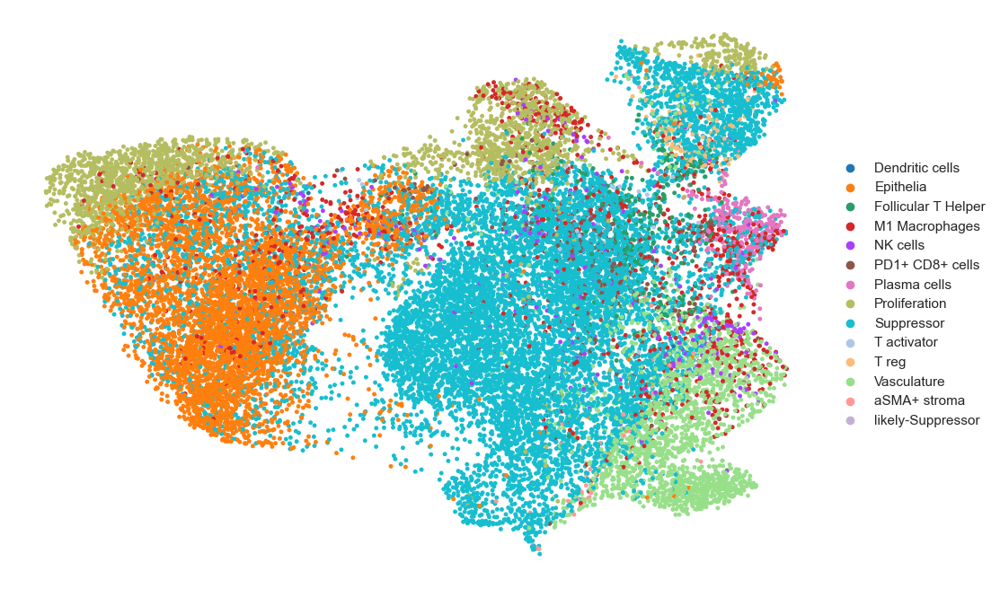

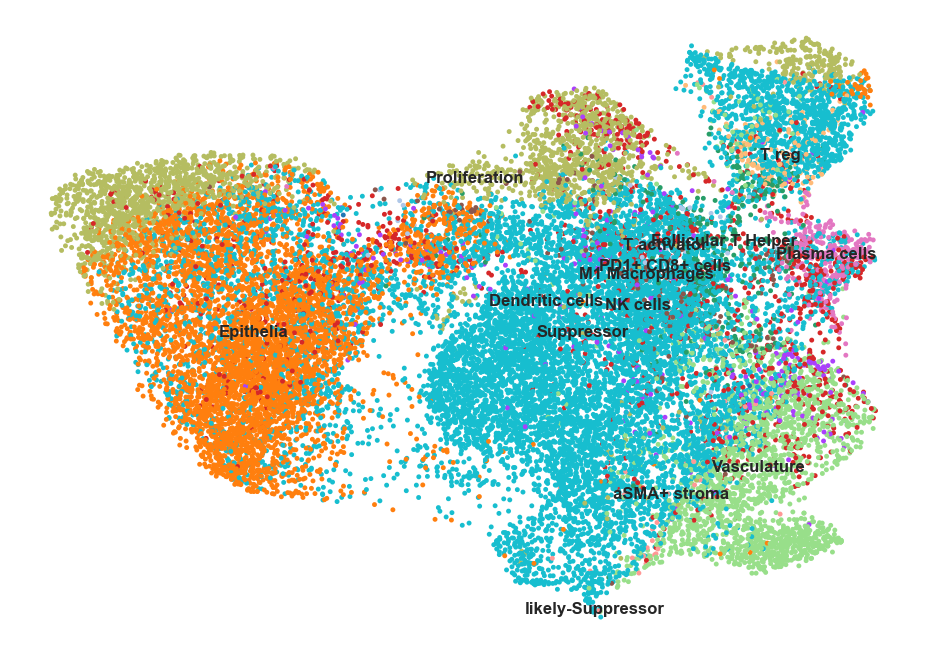

In [217]:
# Load the gating workflow
phenotype = pd.read_csv('phenotype_workflow.csv')
adata = sm.tl.phenotype_cells (adata, phenotype=phenotype, label="phenotype") 

# Summary of the phenotyping
adata.obs['phenotype'].value_counts()

adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
sc.tl.dendrogram(adata, groupby='phenotype')

sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')

# sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib as mpl
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, cmap = mpl.colormaps['magma']) # View the clustering

sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, color_map = 'viridis', legend_loc='on data') # View the clustering

In [146]:
# View phenotypes
sm.pl.image_viewer (image_path, adata, overlay = 'phenotype', point_color='white', point_size=30)

In [184]:
# Summary of the phenotyping
adata.obs['phenotype'].value_counts()

Suppressor             11314
Epithelia               4812
Proliferation           2399
Vasculature             2011
M1 Macrophages          1344
Follicular T Helper      369
NK cells                 304
Plasma cells             271
PD1+ CD8+ cells          197
T reg                    141
aSMA+ stroma              43
T activator               42
Dendritic cells            2
likely-Suppressor          2
Name: phenotype, dtype: int64

In [107]:
# View Leiden clustering
# sm.pl.image_viewer (image_path, adata, overlay = 'leiden', point_color='white', point_size=30)

###Heatmap and UMAP of the probability-based phenotyping

In [185]:
adata.obs['phenotype'] = adata.obs['phenotype'].astype('category')
sc.tl.dendrogram(adata, groupby='phenotype')

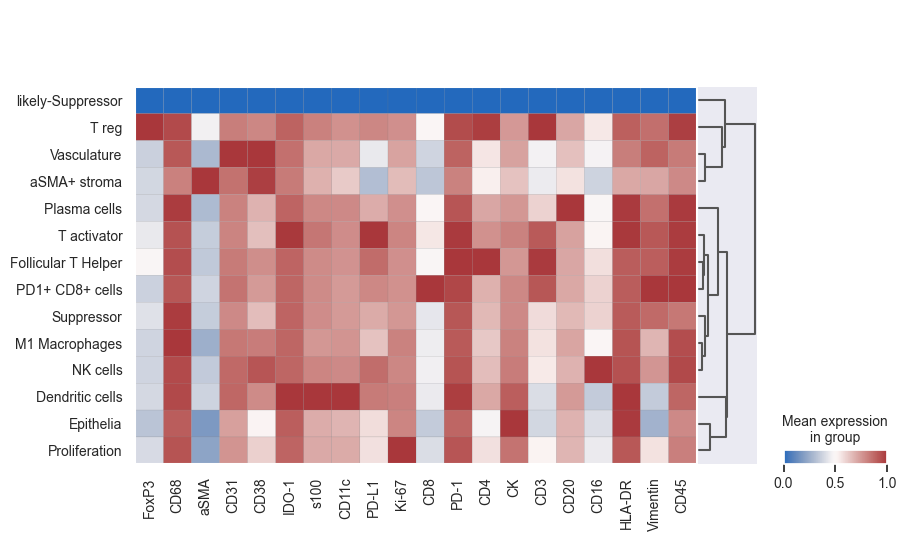

In [186]:
sc.pl.matrixplot(adata, var_names= adata.var.index, groupby='phenotype', dendrogram=True, use_raw=False, cmap="vlag", standard_scale='var')

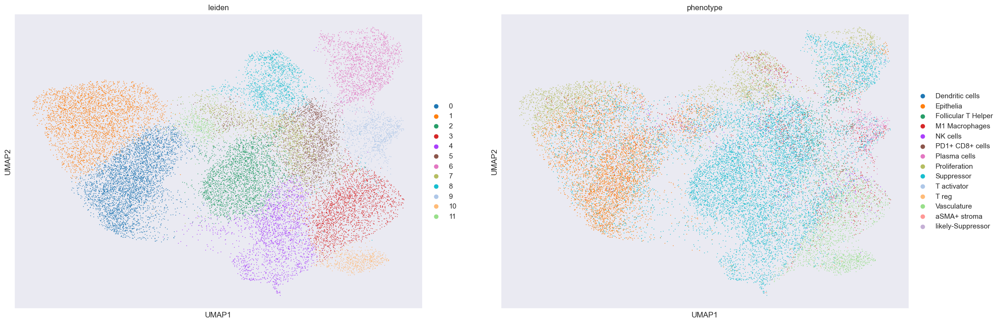

In [180]:
sc.pl.umap(adata, color=['leiden', 'phenotype']) # View the clustering

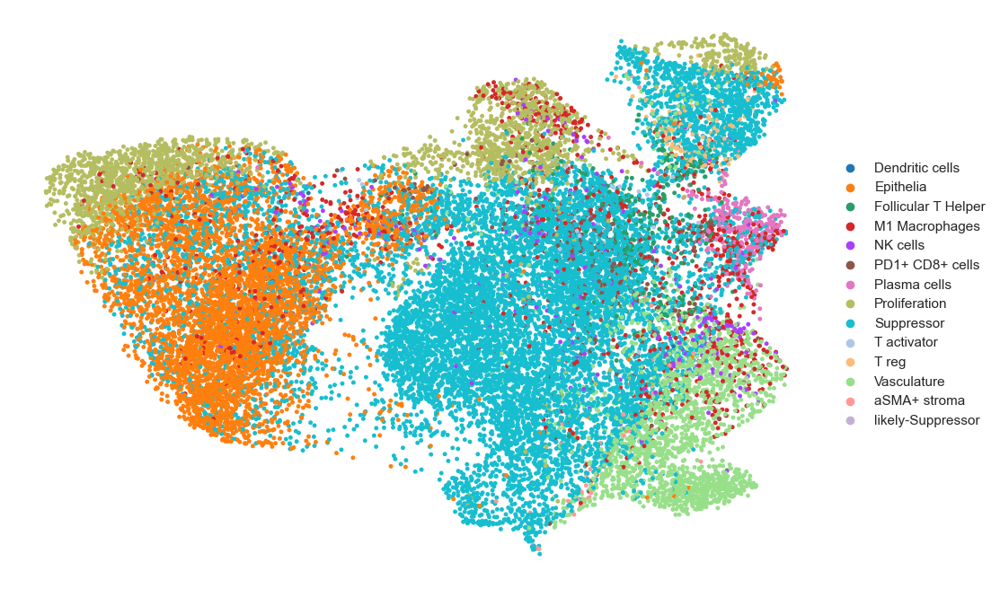

In [181]:
# sns.set(rc={'figure.figsize':(11.7,8.27)})
import matplotlib as mpl
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, cmap = mpl.colormaps['magma']) # View the clustering

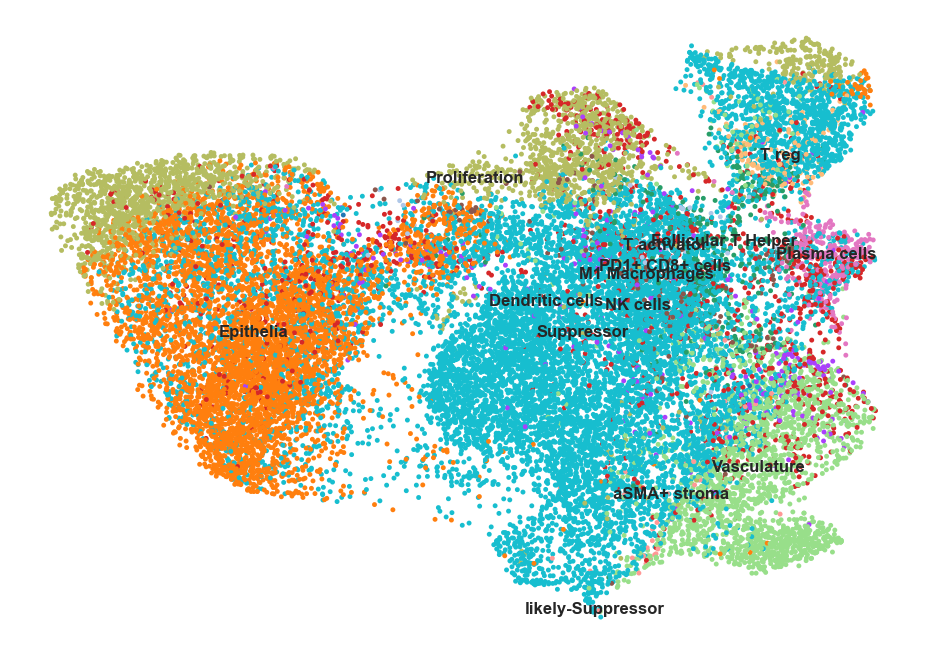

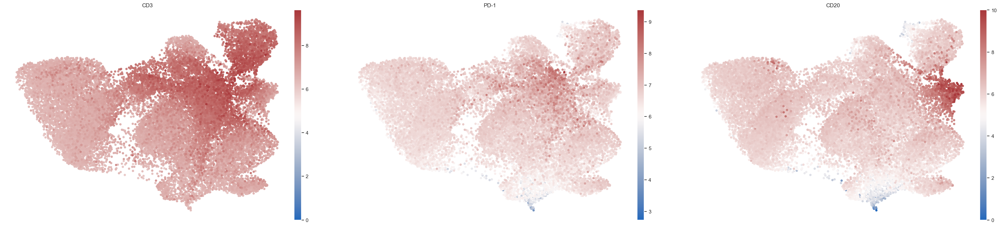

In [182]:
sc.pl.umap(adata, color=['phenotype'], title='', frameon=False, s = 50, color_map = 'viridis', legend_loc='on data') # View the clustering
sc.pl.umap(adata, color=['CD3', 'PD-1', 'CD20'],cmap= 'vlag', use_raw=False, frameon=False, s = 100) # View the clustering

In [118]:
# Confirm Follicular helper T cells in the image
sm.pl.image_viewer (image_path, adata, 
                    overlay = 'phenotype', overlay_category=['Follicular Helper T cells CD4+ PD-1+'], 
                    markers = ['CD3','CD20','PD-1','CD8','CD4','DAPI'],
                    point_color='white', point_size=30)

In [119]:
# Save the results
adata.write('tutorial_data1.h5ad')